# Exploratory Data Analysis of Voting History of the Compound Governance Protocol

**[Johnnatan Messias](https://johnnatan-messias.github.io/), March 2025**

We analyzed the voting history of the Compound Governance Protocol by gathering data from the Ethereum blockchain. This data, collected through an Archive Node, includes all voting history and transfers related to Compound from March 4th, 2020 (starting at block number 9,601,459) to August 19th, 2024 (up to block number 20,563,000).

**Compound dataset**: **Token: COMP**

| Event Name           | # of Events | Description                                                                                                                                                                                                                                                                                                                                                                                                                    |
| -------------------- | ----------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------ |
| Approval             | 256,032     | Standard ERC-20 approval event.                                                                                                                                                                                                                                                                                                                                                                                                |
| DelegateChanged      | 15,244      | Emitted when an account changes its delegate. This means that the delegatee will receive voting power from the sender. Users can only delegate to one address at a time, and the number of votes added to the delegatee’s vote count is equal to the user’s token balance. The delegation of votes will take effect from the current block until the sender either delegates to a different address or transfers their tokens. |
| DelegateVotesChanged | 83,798      | Emitted when a delegate account's vote balance changes.                                                                                                                                                                                                                                                                                                                                                                        |
| Transfer             | 2,224,966   | Emitted when users/holders transfer their tokens to another address.                                                                                                                                                                                                                                                                                                                                                           |

**Governor**

| Event Name       | # of Events | Description                                                                                  |
| ---------------- | ----------- | -------------------------------------------------------------------------------------------- |
| ProposalCanceled | 30          | Emitted when a proposal is canceled.                                                         |
| ProposalCreated  | 307         | Emitted when a new proposal is created.                                                      |
| ProposalExecuted | 238         | Emitted when a proposal is executed in the TimeLock.                                         |
| ProposalQueued   | 246         | Emitted when a proposal is added to the queue in the TimeLock.                               |
| VoteCast         | 14,841      | Emitted when a vote is cast on a proposal: 0 for against, 1 for in-favor, and 2 for abstain. |


In [1]:
import os
import pandas as pd
import json
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import sys
code_dir = os.path.realpath(os.path.join(os.getcwd(), "..", "src"))

sys.path.append(code_dir)

In [3]:
proposal_quorum = 0.04 * 10e6  # 4% of total supply
protocol_name = 'compound'
dynamic_chart = True
plot_style = 'png' if not dynamic_chart else None

In [4]:
from plot_utils import get_plotly_layout
from plot_utils import colors
import plotly.graph_objects as go
from plotly import express as px
from utils import load_dataframes
width, height = 850, 450

In [5]:
# Set directory paths
data_dir = os.path.abspath(
    os.path.join(os.getcwd(), "..", "data")) + os.sep
plots_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "plots")) + os.sep

# Create directories if they don't exist
os.makedirs(data_dir, exist_ok=True)
os.makedirs(plots_dir, exist_ok=True)

In [6]:
dfs = load_dataframes(path_dir=data_dir+protocol_name+os.sep)
for filename in dfs:
    print("Dataframe {} loaded".format(filename))

Loading dataframes: 100%|██████████| 13/13 [00:06<00:00,  1.96it/s]

Dataframe supporters_df loaded
Dataframe approval_df loaded
Dataframe proposal_cancelled_df loaded
Dataframe delegatechanged_df loaded
Dataframe proposal_voting_period_df loaded
Dataframe proposals_queued_df loaded
Dataframe proposal_voting_delay_df loaded
Dataframe delegatevoteschanged_df loaded
Dataframe transfer_df loaded
Dataframe votes_weighted_df loaded
Dataframe proposal_created_df loaded
Dataframe votes_df loaded
Dataframe proposal_executed_df loaded


## Loading Labels


In [7]:
labels_dir = os.path.join(data_dir, "labels")
with open(os.path.join(labels_dir, "labels.json")) as f:
    labels = json.load(f)
print("Labels loaded: {}".format(len(labels)))

Labels loaded: 29738


## Loading Variables


In [8]:
supporters_df = dfs['supporters_df']
proposal_cancelled_df = dfs['proposal_cancelled_df']
# proposal_voting_period_df = dfs['proposal_voting_period_df']
proposals_queued_df = dfs['proposals_queued_df']
votes_weighted_df = dfs['votes_weighted_df']
proposal_created_df = dfs['proposal_created_df']
votes_df = dfs['votes_df']
proposal_executed_df = dfs['proposal_executed_df']
# proposal_voting_delay_df = dfs['proposal_voting_delay_df']

## Exploratory Data Analysis


### Basic Statistics


In [9]:
print("In this dataset, there are {} unique proposals created by {} unique proposers".format(
    proposal_created_df.proposalId.nunique(), proposal_created_df.proposer.nunique()))
print("\tThere are {} proposals executed".format(
    proposal_executed_df.proposalId.nunique()))
print("\tThere are {} proposals queued".format(
    proposals_queued_df.proposalId.nunique()))
print("\tThere are {} proposals canceled".format(
    proposal_cancelled_df.proposalId.nunique()))
# print("\tThere are {} Voting Period change".format(
#     proposal_voting_period_df.shape[0]))
# print("\tThere are {} unique Voting Delay Change".format(
#     proposal_voting_delay_df.shape[0]))

print("There are {} unique voters who have casted {} votes".format(
    votes_df.voter.nunique(), votes_df.shape[0]))

print("Votes were cast trough {} unique transactions".format(
    votes_df.transactionHash.nunique()))

# Empty voting power
print("There are {} votes with 0 voting power".format(
    votes_df.query('votes == 0').shape[0]))

In this dataset, there are 307 unique proposals created by 45 unique proposers
	There are 238 proposals executed
	There are 246 proposals queued
	There are 30 proposals canceled
There are 4538 unique voters who have casted 14841 votes
Votes were cast trough 13926 unique transactions
There are 2463 votes with 0 voting power


In [10]:
# Proposal creation distribution
data = pd.concat([proposal_created_df['proposer'].value_counts(), proposal_created_df['proposer'].value_counts(
    normalize=True)], axis=1, keys=['count', 'percentage']).reset_index()
data['proposer_label'] = data['proposer'].apply(
    lambda x: labels.get(x, x[:6]+"..."+x[-4:]))
display(data['count'].describe().to_frame().T)
data.head()

,count,mean,std,min,25%,50%,75%,max
count,45.0,6.822222,13.230971,1.0,1.0,2.0,8.0,83.0


,proposer,count,percentage,proposer_label
0,0x683a4f9915d6216f73d6df50151725036bd26c02,83,0.270358,Gauntlet
1,0x7b3c54e17d618cc94dadfe7671c1e2f50c4ecc33,32,0.104235,0x7b3c...cc33
2,0x54a37d93e57c5da659f508069cf65a381b61e189,20,0.065147,blck
3,0x3fb19771947072629c8eee7995a2ef23b72d4c8a,17,0.055375,PGov
4,0xc66e426404c742d81655a9d80ce58fdbcee468a9,16,0.052117,0xc66e...68a9


In [11]:
data.query('count >= 8').shape[0]

12

In [12]:
# Votes distribution
data = pd.concat([votes_df.support.value_counts(), votes_df.support.value_counts(
    normalize=True)], axis=1, keys=['count', 'percentage'])
data

,count,percentage
support,,
1,13837,0.932350
0,858,0.057813
2,146,0.009838


In [13]:
# Number of proposals votes by each voter
votes_df.voter.value_counts().describe(
    percentiles=[0.25, 0.5, 0.5250, 0.75, 0.9, 0.95, 0.99])

count    4538.000000
mean        3.270383
std         9.207155
min         1.000000
25%         1.000000
50%         1.000000
52.5%       1.000000
75%         3.000000
90%         6.000000
95%         8.000000
99%        32.000000
max       192.000000
Name: count, dtype: float64

In [14]:
# Distribution of the number of proposals voted by each voter
votes_df.proposalId.value_counts().describe()

count    293.000000
mean      50.651877
std       71.717637
min        1.000000
25%       18.000000
50%       29.000000
75%       52.000000
max      619.000000
Name: count, dtype: float64

In [15]:
# Top proposals with the maximum number of voters
votes_df.proposalId.value_counts().head()

proposalId
111    619
115    579
105    404
131    368
109    341
Name: count, dtype: int64

In [16]:
# Status of the proposals outcome.
votes_weighted_df.status.value_counts()

status
executed    241
defeated     36
canceled     30
Name: count, dtype: int64

In [17]:
# Proposals defeated by the community
proposals_defeated_df = votes_weighted_df.query(
    'status == "defeated"').sort_values(by='proposalId', ascending=True)
print("There are {} proposals defeated by the community".format(
    proposals_defeated_df.proposalId.nunique()))
proposals_defeated_df.head()

There are 36 proposals defeated by the community


,proposalId,against,in_favor,abstain,n_votes,against_percentage,in_favor_percentage,abstain_percentage,supporter_against,supporter_in_favor,...,supporter_against_percentage,supporter_in_favor_percentage,supporter_abstain_percentage,proposer,blockNumber,transactionHash,proposal_title,status,number,timestamp
11,12,538486.083105,133613.887401,0.000000,6.721000e+05,80.119939,19.880061,0.000000,48.0,58.0,...,45.283019,54.716981,0.000000,0x7e4a8391c728fed9069b2962699ab416628b19fa,10375086,ec6cddd238e8ec8b12c44dc2dadcdd315da21586713e34...,Update cDAI Interest Rate Model,defeated,10375086,2020-07-01 18:14:53
13,14,669872.816464,353204.756027,0.000000,1.023078e+06,65.476249,34.523751,0.000000,39.0,85.0,...,31.451613,68.548387,0.000000,0x9695cfaa368718dd6790a6f57b633d83f565893e,10401005,15218a54eb95715d5ec986aaf05f827c2795d895fe2eff...,Set WBTC Collateral Factor to 65%,defeated,10401005,2020-07-05 18:29:49
31,32,681290.374861,212952.205095,0.000000,8.942426e+05,76.186304,23.813696,0.000000,27.0,25.0,...,51.923077,48.076923,0.000000,0x2f04664b18fb9b6d49124fcc876b52a4ba797718,11434044,ab9dfd2e6a998ff5093f3e81bb3bc2840cd6da819b49a2...,Distribute COMP to Affected Users in the DAI L...,defeated,11434044,2020-12-11 21:17:06
37,38,5000.053175,259279.753184,0.000000,2.642798e+05,1.891954,98.108046,0.000000,2.0,17.0,...,10.526316,89.473684,0.000000,0x6626593c237f530d15ae9980a95ef938ac15c35c,11837564,80f138c6c191b8360d09bd238325b9fb6d00a624040ed4...,"Adjust BAT, ZRX collateral factors",defeated,11837564,2021-02-11 20:54:06
66,67,279499.278763,121013.025546,182562.700737,5.830750e+05,47.935390,20.754281,31.310329,8.0,16.0,...,29.629630,59.259259,11.111111,0xc8a69971daa3c3add85ab0d0af297515769ddffc,13541005,bb0f58cf06878cfbae41b74f3c26949920366ddbdfc887...,[Temp. Check] Should Compound retroactively di...,defeated,13541005,2021-11-03 01:34:38


### Proposals


In [18]:
proposals_created_timestamp_df = votes_weighted_df[['proposalId', 'blockNumber', 'status', 'timestamp']].rename(
    columns={'timestamp': 'proposal_created_timestamp'}).sort_values(by='proposal_created_timestamp')

display(((proposals_created_timestamp_df['proposal_created_timestamp'].diff(
).dt.total_seconds().describe())/3600/24).to_frame().T)

maker_colors = {'executed': colors['green'],
                'defeated': colors['red'], 'canceled': colors['blue']}

markers = {'executed': 'circle', 'defeated': 'x', 'canceled': 'diamond-tall'}

data = proposals_created_timestamp_df.set_index(
    'proposal_created_timestamp').resample('ME')['proposalId'].count()

fig = go.Figure(layout=get_plotly_layout(width=width, height=height))
fig.add_trace(go.Scatter(x=data.index, y=data, line=dict(
    color=colors['blue'], width=4), mode='lines+markers', name='Count', marker_size=10))

for status in ['executed', 'defeated', 'canceled']:
    data = proposals_created_timestamp_df.query(
        'status == @status').reset_index()
    data['text'] = "Proposal #" + data['proposalId'].astype(str)
    fig.add_trace(go.Scatter(x=proposals_created_timestamp_df.query('status==@status')['proposal_created_timestamp'],
                             y=[-1]*len(proposals_created_timestamp_df),
                             mode='markers', name=status.capitalize(),
                             marker=dict(
        color=maker_colors[status], size=15, opacity=0.7, symbol=markers[status], line=dict(width=1, color='white')
    ), text=data['text']))

fig.update_layout(
    xaxis_title='Proposal creation time',
    yaxis_title='Number of proposals',
    legend=dict(xanchor='center', x=0.5, y=1.15, orientation='h'),
    yaxis=dict(tickmode='linear', tick0=0, dtick=5)
)
fig.update_xaxes(
    dtick="M4", tickformat="%b\n%Y",
    range=[proposals_created_timestamp_df.proposal_created_timestamp.min()-pd.Timedelta('3W'),
           proposals_created_timestamp_df.proposal_created_timestamp.max()+pd.Timedelta('3W')])
fig.update_yaxes(range=[-1.8, 27])

file_dir = os.path.join(
    plots_dir, "number_of_proposals_per_month_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=width, height=height, scale=1)

fig.show(plot_style)

,count,mean,std,min,25%,50%,75%,max
proposal_created_timestamp,0.003542,5.130986,5.591237,0.0,0.779931,3.194913,7.625903,31.136551


### Votes Cast


In [19]:
# Plot showing the distribution of COMP tokens held by voters during a voting period
fig = go.Figure(layout=get_plotly_layout(width=1540, height=350))

display(votes_df.votes.describe().to_frame().T)

min_votes = 1e-3

data = votes_df.query(
    '(proposalId not in @proposals_defeated_df.proposalId) and (votes >= @min_votes)'
).groupby('proposalId').agg({'votes': ['mean', 'median']})

fig.add_trace(go.Scatter(x=data.index, y=data[('votes', 'median')], line=dict(
    color=colors['brown'], width=2), mode='lines', name='median'))

data = votes_df.query(
    '(proposalId not in @proposals_defeated_df.proposalId) and (votes >= @min_votes)')

fig.add_trace(go.Box(x=data.proposalId, y=data.votes,
              name='Executed', marker_color=colors['green'], line=dict(width=1.5), whiskerwidth=0.5, fillcolor=colors['white']))

data = votes_df.query(
    '(proposalId in @proposals_defeated_df.proposalId) and (votes >= @min_votes)')
fig.add_trace(go.Box(x=data.proposalId, y=data.votes,
              name='Defeated', marker_color=colors['red'], line=dict(width=1.5), whiskerwidth=0.5, fillcolor=colors['white']))

data = votes_df.query(
    '(proposalId in @proposal_cancelled_df.proposalId) and (votes >= @min_votes)')
fig.add_trace(go.Box(x=data.proposalId, y=data.votes,
              name='Canceled', marker_color=colors['blue'], line=dict(width=1.5), whiskerwidth=0.5, fillcolor=colors['white']))

fig.update_layout(yaxis_title="Number of Votes", xaxis_title="Proposal ID",
                  xaxis=dict(tickmode='linear', tick0=0, dtick=20),
                  legend=dict(xanchor='center', x=0.5, y=1.15, orientation='h'))

fig.update_yaxes(type="log")

file_dir = os.path.join(
    plots_dir, "distribution_of_voting_power_by_voter_per_proposal_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=1540, height=350, scale=1)

fig.show(plot_style)

,count,mean,std,min,25%,50%,75%,max
votes,14841.0,13277.57193,40143.130077,0.0,0.0101,0.147143,39.57343,361006.425111


In [20]:
proposal_cancelled_block_number = proposal_cancelled_df[[
    'proposalId', 'blockNumber']].set_index('proposalId').blockNumber.to_dict()
proposal_queued_block_number = proposals_queued_df[[
    'proposalId', 'blockNumber']].set_index('proposalId').blockNumber.to_dict()

### Proposal Lifecycle


In [21]:
# Quorum is the minimum number for votes (i.e., votes in favor) required for a proposal to pass. In Compound, proposals should have more than 400k votes in favor to pass.

life_cycle_df = pd.DataFrame()
life_cycle_df['proposalId'] = proposal_created_df.proposalId.unique()

life_cycle_df.loc[life_cycle_df['proposalId'].isin(
    proposal_created_df.proposalId), 'Proposal created'] = 'Created'

life_cycle_df.loc[life_cycle_df['proposalId'].isin(
    proposal_created_df.proposalId), 'Voting period'] = 'Active'

life_cycle_df['Voting ends'] = 'Succeeded'

life_cycle_df.loc[life_cycle_df['proposalId'].isin(votes_weighted_df.query(
    '(in_favor <= against) or (in_favor < @proposal_quorum)').proposalId), 'Voting ends'] = 'Defeated'

life_cycle_df.loc[life_cycle_df['proposalId'].isin(
    proposals_queued_df.proposalId), 'Timelock'] = 'Executed'

for _, row in proposal_created_df.query('proposalId in @proposal_cancelled_df.proposalId').iterrows():
    # print(row['startBlock'], proposal_cancelled_block_number[row['proposalId']], row['endBlock'])
    if row['startBlock'] > proposal_cancelled_block_number[row['proposalId']]:
        life_cycle_df.loc[life_cycle_df['proposalId'] ==
                          row['proposalId'], 'Proposal created'] = 'Canceled'
    if row['startBlock'] <= proposal_cancelled_block_number[row['proposalId']] <= row['endBlock']:
        life_cycle_df.loc[life_cycle_df['proposalId'] ==
                          row['proposalId'], 'Voting period'] = 'Canceled'
    if row['proposalId'] in proposal_queued_block_number and (proposal_cancelled_block_number[row['proposalId']] > proposal_queued_block_number[row['proposalId']]):
        life_cycle_df.loc[life_cycle_df['proposalId'] ==
                          row['proposalId'], 'Timelock'] = 'Canceled'

aux = set(proposal_cancelled_df.proposalId.unique()) - set(life_cycle_df.loc[(life_cycle_df['Proposal created'] == 'Canceled') | (
    life_cycle_df['Voting period'] == 'Canceled') | (life_cycle_df['Timelock'] == 'Canceled')].proposalId)
life_cycle_df.loc[life_cycle_df['proposalId'].isin(
    aux), 'Voting ends'] = 'Canceled'

# life_cycle_df = life_cycle_df.merge(votes_weighted_df[['proposalId', 'status']], on='proposalId', how='left')
# life_cycle_df['Timelock'].fillna('Canceled', inplace=True)

life_cycle_df.loc[life_cycle_df['Proposal created']
                  == "Canceled", "Voting period"] = "Canceled"
life_cycle_df.loc[life_cycle_df['Voting period']
                  == "Canceled", "Voting ends"] = "Canceled"
life_cycle_df.loc[life_cycle_df['Voting ends']
                  == "Canceled", "Timelock"] = "Canceled"

life_cycle_df.loc[life_cycle_df['Voting ends']
                  == "Defeated", "Timelock"] = "Defeated"

life_cycle_df['final_status'] = life_cycle_df['Timelock'].map(
    {'Canceled': colors['blue'], 'Executed': colors['green'], 'Defeated': colors['red']})

life_cycle_df['final_status'] = life_cycle_df['Timelock'].map(
    {'Canceled': 2, 'Executed': 1, 'Defeated': 0})

life_cycle_df.head()

,proposalId,Proposal created,Voting period,Voting ends,Timelock,final_status
0,1,Created,Active,Succeeded,Executed,1
1,2,Created,Active,Succeeded,Executed,1
2,3,Created,Active,Succeeded,Executed,1
3,4,Created,Active,Succeeded,Executed,1
4,5,Created,Active,Succeeded,Executed,1


In [22]:
life_cycle_df['Timelock'] = pd.Categorical(
    life_cycle_df['Timelock'], life_cycle_df['Timelock'].value_counts(normalize=False).index, ordered=True)
life_cycle_df['Voting ends'] = pd.Categorical(
    life_cycle_df['Voting ends'], life_cycle_df['Voting ends'].value_counts(normalize=False).index, ordered=True)
life_cycle_df['Voting period'] = pd.Categorical(
    life_cycle_df['Voting period'], life_cycle_df['Voting period'].value_counts(normalize=False).index, ordered=True)
life_cycle_df['Proposal created'] = pd.Categorical(
    life_cycle_df['Proposal created'], life_cycle_df['Proposal created'].value_counts(normalize=False).index, ordered=True)
life_cycle_df.sort_values(
    ['Proposal created', 'Voting period', 'Voting ends', 'Timelock'], inplace=True)
fig = px.parallel_categories(life_cycle_df, dimensions=[
                             'Proposal created', 'Voting period', 'Voting ends', 'Timelock'],
                             color="final_status", color_continuous_scale=[colors['red'], colors['green'], colors['blue']])
fig.update_layout(get_plotly_layout(
    width=width, height=height), font=dict(size=26))
fig.update(layout_coloraxis_showscale=False, layout=dict(margin=go.layout.Margin(
    l=65,  # left margin
    r=65,  # right margin
    b=30,  # bottom margin
    t=30  # top margin
)))

file_dir = os.path.join(
    plots_dir, "proposal_life_cycle_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=width, height=height, scale=1)

fig.show(plot_style)

In [23]:
fig = go.Figure(layout=get_plotly_layout(width=width, height=height))

# Percentage of the fraction of supporters votes per proposal

data = votes_weighted_df.set_index('proposalId').sort_index()[
    ['supporter_in_favor_percentage', 'supporter_against_percentage',
        'supporter_abstain_percentage']
]
data.rename(columns={'supporter_in_favor_percentage': 'in-favor',
            'supporter_against_percentage': 'against', 'supporter_abstain_percentage': 'abstain'}, inplace=True)
markers = {'in-favor': 'circle', 'against': 'x', 'abstain': 'diamond-tall'}

line_colors = {'in-favor': colors['green'],
               'against': colors['red'], 'abstain': colors['blue']}

for column in ['in-favor', 'against', 'abstain']:
    fig.add_trace(go.Scatter(x=data.index, y=data[column], mode='markers', name=column.replace('_percentage', ''),
                             marker=dict(color=line_colors[column], symbol=markers[column], size=10,  opacity=0.7, line=dict(width=1, color=colors['white']))))

for cancelled_id in proposal_cancelled_df.proposalId.unique():
    fig.add_vline(x=cancelled_id, line_width=2,
                  line_dash="dash", line_color="darkslategrey")

fig.update_layout(yaxis_title="Percentage", xaxis_title="Proposal ID",
                  xaxis=dict(tickmode='linear', tick0=0, dtick=30),
                  legend=dict(xanchor='center', x=0.5, y=1.15, orientation='h'), yaxis_ticksuffix="%")

# set x axis and y axsis limit
fig.update_xaxes(range=[-.2, data.index.max() + 1])
fig.update_yaxes(range=[-3, 101])

file_dir = os.path.join(
    plots_dir, "proposal_votes_percentage_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=width, height=height, scale=1)

fig.show(plot_style)

In [24]:
data['in-favor'].describe()

count    307.000000
mean      88.634612
std       24.487148
min        0.000000
25%       91.885965
50%       97.660819
75%      100.000000
max      100.000000
Name: in-favor, dtype: float64

### Top Voters per Proposal


In [26]:
delegate_votes_changed_df = dfs['delegatevoteschanged_df']
delegate_votes_changed_df.head()

,blockNumber,transactionHash,blockHash,address,transactionIndex,logIndex,event,delegate,previousBalance,newBalance
0,9686030,528ccc9baf339a4b0cb2645f4dd2344dc18a6a05bc260d...,3398225f53e2e75569081b220ca133c16f30fceb5c8afb...,0xc00e94cb662c3520282e6f5717214004a7f26888,130,113,DelegateVotesChanged,0xe12283144353f56b7f7f37cd30a8e4a6b7827efc,0.0,1.00
1,9697764,87e3b3d3a3c9925881bff8aa47134ef0e1c17724806937...,da988fda3d3a7c15033082958b13cf36d7e52435eb7d00...,0xc00e94cb662c3520282e6f5717214004a7f26888,15,13,DelegateVotesChanged,0xe12283144353f56b7f7f37cd30a8e4a6b7827efc,1.0,0.00
2,9697764,87e3b3d3a3c9925881bff8aa47134ef0e1c17724806937...,da988fda3d3a7c15033082958b13cf36d7e52435eb7d00...,0xc00e94cb662c3520282e6f5717214004a7f26888,15,14,DelegateVotesChanged,0x2ad9ea1e677949a536a270cec812d6e868c88108,0.0,1.00
3,9710667,86718c9ee2f9a5c7159989334244ba9b335ab9ea79dc86...,56b015b0236faaaf70f40f2037b8a7872dcdd570634ad6...,0xc00e94cb662c3520282e6f5717214004a7f26888,43,42,DelegateVotesChanged,0xe6b254ff4c7f7b2ab945f9b605098db94da9bcff,0.0,18080.73
4,9710667,478b7ab352da7d2885be8bcd5298e32afb5071de2afeeb...,56b015b0236faaaf70f40f2037b8a7872dcdd570634ad6...,0xc00e94cb662c3520282e6f5717214004a7f26888,52,48,DelegateVotesChanged,0x4654f56a64301b9b582f843f97332d96ead11ff8,0.0,30158.66


In [27]:
delegated_tokens_snapshot_df = delegate_votes_changed_df.groupby(by=['delegate', 'blockNumber'])[
    'newBalance'].last().sort_index(level=1)
delegated_tokens_snapshot_df.head()

delegate                                    blockNumber
0xe12283144353f56b7f7f37cd30a8e4a6b7827efc  9686030            1.00
0x2ad9ea1e677949a536a270cec812d6e868c88108  9697764            1.00
0xe12283144353f56b7f7f37cd30a8e4a6b7827efc  9697764            0.00
0x4654f56a64301b9b582f843f97332d96ead11ff8  9710667        30158.66
0xe6b254ff4c7f7b2ab945f9b605098db94da9bcff  9710667        18080.73
Name: newBalance, dtype: float64

In [28]:
voting_delay_df = votes_df.groupby('proposalId').blockNumber.agg(['min', 'max']).rename(columns={'min': 'min_block_vote', 'max': 'max_block_vote'}).merge(
    proposal_created_df[['proposalId', 'blockNumber', 'startBlock', 'endBlock', 'proposal_title']].set_index('proposalId').sort_index(), left_index=True, right_index=True, how='right').reset_index().fillna(0)
voting_delay_df['voting_delay'] = (
    voting_delay_df['min_block_vote'] - voting_delay_df['startBlock']).clip(lower=0)
voting_delay_df = voting_delay_df.astype(
    {'min_block_vote': 'int', 'max_block_vote': 'int', 'voting_delay': 'int'})
display(voting_delay_df['voting_delay'].describe().to_frame().T)
voting_delay_df.set_index('proposalId', inplace=True)
voting_delay_df

,count,mean,std,min,25%,50%,75%,max
voting_delay,307.0,1086.084691,1563.136544,0.0,105.5,500.0,1326.5,9794.0


,min_block_vote,max_block_vote,blockNumber,startBlock,endBlock,proposal_title,voting_delay
proposalId,,,,,,,
1,9952490,9969185,9951904,9951905,9969185,Add USDT Support,585
2,9956605,9970692,9956584,9956585,9973865,Update DAI Interest Rate Model to Better Accom...,20
3,10065435,10080149,10065392,10065393,10082673,Changing SAI reserve factor to 100% and collat...,42
4,10117098,10133309,10117038,10117039,10134319,Changing SAI collateral factor to 55%,59
5,10180802,10194136,10179118,10179119,10196399,Changing SAI collateral factor to 45%,1683
...,...,...,...,...,...,...,...
303,20487905,20506887,20474092,20487232,20506942,[Gauntlet] Risk and IO Parameter Recommendatio...,673
304,20513627,20533012,20500199,20513339,20533049,Add Proposal Guardian to Governor Bravo,288
305,20532979,20550641,20518659,20531799,20551509,Update Price Feeds on Arbitrum for LSTs,1180


In [29]:
def get_proposal_votes_fraction(proposal_ids):
    df = list()
    for proposal_id in proposal_ids:
        start_block = voting_delay_df.loc[proposal_id]['startBlock']
        end_block = voting_delay_df.loc[proposal_id]['endBlock']
        created_at_block_number = voting_delay_df.loc[proposal_id]['blockNumber']
        total_votes = votes_df.query(
            'proposalId == @proposal_id').votes.sum()
        total_possible_votes = delegated_tokens_snapshot_df.to_frame().query(
            'blockNumber < @start_block').groupby('delegate').last().sum().values[0]
        voting_participation_fraction = round(
            total_votes/total_possible_votes, 4)
        data = dict(proposal_id=proposal_id, start_block=start_block, end_block=end_block, proposal_created_block_number=created_at_block_number,
                    total_possible_votes=total_possible_votes, proposal_total_votes=total_votes, voting_participation_fraction=voting_participation_fraction)
        df.append(data)
    return pd.DataFrame(df)

In [30]:
proposal_votes_df = get_proposal_votes_fraction(
    sorted(proposal_created_df.proposalId.unique()))
proposal_votes_df = proposal_votes_df.merge(
    votes_weighted_df[['proposalId', 'status']],
    left_on='proposal_id', right_on='proposalId', how='right'
).drop(columns=['proposal_id']
       ).rename(columns={'proposalId': 'proposal_id'}).fillna(0)
proposal_votes_df.set_index('proposal_id', inplace=True)
proposal_votes_df

proposal_status = proposal_votes_df.status.to_dict()

### Voting participation fraction

In [31]:
# Top 10 voters by number of weighted votes per proposal -- Cummulative voting distribution
import warnings
warnings.filterwarnings("ignore")

top_n = 10
top_voters_per_proposal_df = votes_df.copy()

top_voters_per_proposal_df['voter_label'] = top_voters_per_proposal_df['voter'].apply(
    lambda x: labels.get(x, x[:6]+"..."+x[-4:]))


top_voters_per_proposal_df['voter_label'] = top_voters_per_proposal_df.apply(
    lambda x: x['voter'][:6] + ' ... ' + x['voter'][-4:] if x['voter'] == x['voter_label'] else x['voter_label'], axis=1)
top_voters_per_proposal_df['votes_fraction'] = top_voters_per_proposal_df['votes'] / \
    top_voters_per_proposal_df.groupby('proposalId')['votes'].transform('sum')

top_voters_per_proposal_df['support'] = top_voters_per_proposal_df['support'].map(
    {0: 'against', 1: 'in_favor', 2: 'abstain'})

top_voters_per_proposal_df = top_voters_per_proposal_df.groupby('proposalId').apply(
    lambda x: x.sort_values(by='votes_fraction', ascending=False).head(top_n))[
        ['voter', 'votes', 'votes_fraction', 'support', 'voter_label']
].reset_index()

top_voters_per_proposal_df['votes_fraction_cum'] = top_voters_per_proposal_df.groupby(
    'proposalId')['votes_fraction'].cumsum()

top_voters_per_proposal_df['ranking'] = top_voters_per_proposal_df.groupby(
    'proposalId').votes_fraction.rank(method='first', ascending=False).astype(int)

top_voters_per_proposal_df.rename(
    columns={'proposalId': 'Proposal', 'voter_label': 'Top voters',
             'votes_fraction_cum': 'Votes fraction cum', 'support': 'Voter'},
    inplace=True)
data = top_voters_per_proposal_df.sort_values(by=['Proposal', 'ranking'])
display(data)

grid = sns.catplot(data.rename(columns={'Votes fraction cum': 'CDF'}).sort_values(by=['Proposal', 'ranking'], ascending=[
                   False, False]), x='ranking', y='CDF', col='Proposal',
                   col_wrap=15, hue='Voter', kind='strip', s=100, sharex=False, height=6, aspect=.5, palette=dict(
    in_favor=colors['green'], against=colors['red'], abstain=colors['blue']))

for axes in grid.axes.flatten():
    proposal_id = int(axes.get_title().split('=')[-1].strip())
    axes.set_xticklabels(data.query(
        'Proposal == @proposal_id')['Top voters'], rotation=90)
    axes.set_title(
        f'{proposal_id} ({proposal_status[proposal_id][0].upper()})')
    axes.axhline(y=0.5, color=colors['grey'],
                 linestyle='--', linewidth=3, zorder=1)
grid.set(ylim=(0, 1))
grid.set_axis_labels('')

sns.move_legend(grid, "upper center", ncol=3,
                bbox_to_anchor=(.67, 0.04), fontsize=36, markerscale=3, title='Vote', title_fontsize=36)

plt.tight_layout()

file_dir = os.path.join(
    plots_dir, "top_voters_per_proposal_tag_cum_{}.pdf".format(protocol_name))

plt.savefig(file_dir, bbox_inches='tight')

,Proposal,level_1,voter,votes,votes_fraction,Voter,Top voters,Votes fraction cum,ranking
0,1,36,0xed409c9ff60f3020abf9012bcd45fc294f5608ff,325712.270000,0.368635,in_favor,Polychain Capital,0.368635,1
1,1,37,0x8169522c2c57883e8ef80c498aab7820da539806,101000.000000,0.114310,in_favor,Geoffrey Hayes,0.482945,2
2,1,7,0xe5a52921901c58971ba60725651dc28bde98beb9,100010.000000,0.113190,in_favor,ParaFi Capital,0.596135,3
3,1,4,0x1d29756e8f7b091ce6c11a35980de79c7eda5d1f,50000.000000,0.056589,in_favor,InstaDApp,0.652724,4
4,1,41,0xaf7eaf66b5f1fa23158784fb4c17dba90727afad,25000.000000,0.028295,against,Zerion,0.681019,5
...,...,...,...,...,...,...,...,...,...
2852,307,14798,0x13bdae8c5f0fc40231f0e6a4ad70196f59138548,50000.122923,0.081238,in_favor,Michigan Blockchain,0.698155,6
2853,307,14829,0xdc1f98682f4f8a5c6d54f345f448437b83f5e432,50000.000000,0.081237,in_favor,BlockchainatCU,0.779393,7
2854,307,14818,0x7b3c54e17d618cc94dadfe7671c1e2f50c4ecc33,50000.000000,0.081237,in_favor,0x7b3c...cc33,0.860630,8
2855,307,14799,0x3fb19771947072629c8eee7995a2ef23b72d4c8a,45550.000000,0.074007,in_favor,PGov,0.934638,9


In [32]:
# Number of voters necessary to reach 50% of the total votes
# The plot shows the minimum number of voters necessary to reach 50% of the total votes for each proposal.
# We use a rolling window of 7 proposals to smooth the data.
fig = go.Figure(layout=get_plotly_layout(width=width, height=height))

groupped_data = top_voters_per_proposal_df.rename(
    columns={'Votes fraction cum': 'votes_fraction_cum'}
).reset_index(drop=True).set_index('Proposal').groupby(level='Proposal')
data = groupped_data.apply(lambda x: x.query(
    'votes_fraction_cum >= 0.5')['ranking'].min())
print("On average, it takes {} voters to reach 50% of the total votes.".format(
    data.mean().round(2)))
display(data.describe().to_frame().T)

data = data.to_frame().merge(proposals_created_timestamp_df[[
    'proposalId', 'proposal_created_timestamp']], left_on="Proposal", right_on="proposalId", how="left")
data.columns = ['min_voters', 'proposalId', 'timestamp']
data = data.set_index('timestamp').sort_index()

data_sample = data['min_voters'].resample(
    'W').last().ffill().rolling(window=20)

data_mean = data['min_voters'].resample(
    'W').mean().ffill().rolling(window=10).mean()
data_max = data['min_voters'].resample(
    'W').max().ffill().rolling(window=10).max()
data_min = data['min_voters'].resample(
    'W').min().ffill().rolling(window=10).min()
data_median = data['min_voters'].resample(
    'W').median().ffill().rolling(window=10).median()

fig.add_trace(go.Scatter(x=data_mean.index, y=data_mean, line=dict(
    color=colors['blue'], width=4, dash='solid'), mode='lines', name='Mean'))

fig.add_trace(go.Scatter(x=data_max.index, y=data_max, line=dict(
    color=colors['red'], width=3, dash='dash'), mode='lines', name='Max'))

fig.add_trace(go.Scatter(x=data_median.index, y=data_median, line=dict(
    color=colors['green'], width=3, dash='dot'), mode='lines', name='Median'))

fig.update_layout(
    yaxis_title="Nakamoto coefficient", xaxis_title="Date",
    legend=dict(xanchor='center', x=0.5, y=1.05, orientation='h'))

fig.update_xaxes(dtick="M4", tickformat="%b\n%Y",)

file_dir = os.path.join(
    plots_dir, "voting_power_to_reach_50_perc_of_votes_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=width, height=height, scale=1)
fig.show(plot_style)

On average, it takes 3.18 voters to reach 50% of the total votes.


,count,mean,std,min,25%,50%,75%,max
0,292.0,3.178082,1.536206,1.0,2.0,3.0,4.0,8.0


In [33]:
# Number of voters necessary to reach 50% of the total votes
# The plot shows the minimum number of voters necessary to reach 50% of the total votes for each proposal.
# We use a rolling window of 7 proposals to smooth the data.
fig = go.Figure(layout=get_plotly_layout(width=width, height=height))

groupped_data = top_voters_per_proposal_df.rename(
    columns={'Votes fraction cum': 'votes_fraction_cum'}
).reset_index(drop=True).set_index('Proposal').groupby(level='Proposal')
data = groupped_data.apply(lambda x: x.query(
    'votes_fraction_cum >= 0.5')['ranking'].min())
print("On average, it takes {} voters to reach 50% of the total votes.".format(
    data.mean().round(2)))
display(data.describe().to_frame().T)

data = data.to_frame().merge(proposals_created_timestamp_df[[
    'proposalId', 'proposal_created_timestamp']], left_on="Proposal", right_on="proposalId", how="left")
data.columns = ['min_voters', 'proposalId', 'timestamp']
data = data.set_index('proposalId').sort_index()

fig.add_trace(go.Scatter(x=data.index, y=data['min_voters'].rolling(window=10).mean(), line=dict(
    color=colors['blue'], width=4), mode='lines'))

fig.update_layout(yaxis_title="Nakamoto coefficient", xaxis_title="Proposal ID",  xaxis=dict(tickmode='linear', tick0=0, dtick=40),
                  legend=dict(xanchor='center', x=0.5, y=1.15, orientation='h'))

fig.update_xaxes(range=[10, 290])
file_dir = os.path.join(
    plots_dir, "voting_power_to_reach_50_perc_of_votes_proposal_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=width, height=height, scale=1)
fig.show(plot_style)

On average, it takes 3.18 voters to reach 50% of the total votes.


,count,mean,std,min,25%,50%,75%,max
0,292.0,3.178082,1.536206,1.0,2.0,3.0,4.0,8.0


In [34]:
top_voters_per_proposal_df.voter.unique().size

211

In [35]:
sum(list(map(lambda x: x in labels, top_voters_per_proposal_df.voter.unique())))

101

### Voting turnout

In [36]:
# Fraction of the voting participation each proposal received during the voting period

fig = go.Figure(layout=get_plotly_layout(width=width, height=height))

maker_colors = {'executed': colors['green'],
                'defeated': colors['red'], 'canceled': colors['blue']}

markers = {'executed': 'circle', 'defeated': 'x', 'canceled': 'diamond-tall'}

data = proposal_votes_df[['voting_participation_fraction', 'status']]
n_proposals = data.index.max()
display(data['voting_participation_fraction'].describe().to_frame().T)

for status in ['executed', 'defeated', 'canceled']:
    data = proposal_votes_df.query('status == @status')
    fig.add_trace(go.Scatter(x=data.index, y=100*data['voting_participation_fraction'],
                             mode='markers', name=status.capitalize(),
                             marker=dict(color=maker_colors[status], size=10, symbol=markers[status], opacity=0.7, line=dict(width=1, color='white'))))

moving_average = proposal_votes_df['voting_participation_fraction'].rolling(
    window=10).mean()

fig.add_trace(go.Scatter(x=moving_average.index, y=100*moving_average, line=dict(
    color=colors['brown'], width=2), mode='lines', name='Moving Average'))


fig.update_layout(yaxis_title="Participation percentage", xaxis_title="Proposal ID",
                  xaxis=dict(tickmode='linear', tick0=0, dtick=20),
                  legend=dict(xanchor='center', x=0.5, y=1.15, orientation='h'), yaxis_ticksuffix="%")

fig.update_yaxes(range=[0, 100])
fig.update_xaxes(range=[-1, n_proposals+1])

file_dir = os.path.join(
    plots_dir, "voting_participation_fraction_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=width, height=height, scale=1)

fig.show(plot_style)

,count,mean,std,min,25%,50%,75%,max
voting_participation_fraction,307.0,0.280269,0.144439,0.0,0.2043,0.2625,0.3469,0.808


### Voting Delay


In [37]:
file_dir = os.path.join(data_dir + "blocks",
                        "block_timestamp__9600000_20563001.csv.gz")
blocks_df = pd.read_csv(file_dir)
blocks_df['timestamp'] = pd.to_datetime(
    blocks_df['timestamp']).dt.tz_localize(None)
blocks_df.head()

,number,timestamp
0,20563001,2024-08-19 13:34:11
1,20563000,2024-08-19 13:33:59
2,20562999,2024-08-19 13:33:47
3,20562998,2024-08-19 13:33:35
4,20562997,2024-08-19 13:33:23


In [38]:
# Compute the fraction of votes per hour
voting_period_duration_df = votes_df[['blockNumber', 'proposalId', 'votes', 'transactionIndex',
                                      'logIndex', 'support', 'voter', 'transactionHash']].rename(columns={'blockNumber': 'blockNumber_vote_cast'})
# It computes the time when the proposal was created
voting_period_duration_df = voting_period_duration_df.merge(proposal_created_df[['startBlock', 'proposalId']].rename(
    columns={'startBlock': 'blockNumber_voting_period_start'}), on='proposalId', how='left').dropna()

# It computes the time the voting period started
voting_period_duration_df = voting_period_duration_df.merge(blocks_df, left_on='blockNumber_voting_period_start', right_on='number',
                                                            how='left').rename(columns={'timestamp': 'timestamp_voting_period_start'}).drop(columns=['number'])
# It computes the time the votes were casted
voting_period_duration_df = voting_period_duration_df.merge(blocks_df, left_on='blockNumber_vote_cast', right_on='number',
                                                            how='left').rename(columns={'timestamp': 'timestamp_vote_cast'}).drop(columns=['number'])
# It computes the time it took for the votes to be casted
voting_period_duration_df['voting_delay'] = voting_period_duration_df['timestamp_vote_cast'] - \
    voting_period_duration_df['timestamp_voting_period_start']

# Include the proposal final status
voting_period_duration_df = voting_period_duration_df.merge(
    votes_weighted_df[['proposalId', 'status']], on='proposalId', how='left')

voting_period_duration_df.head()

,blockNumber_vote_cast,proposalId,votes,transactionIndex,logIndex,support,voter,transactionHash,blockNumber_voting_period_start,timestamp_voting_period_start,timestamp_vote_cast,voting_delay,status
0,9952490,1,24107.64,44,35,1,0xb0325dbe7fa891436e83a094f9f12848c78e449b,07076f7d6247f9c5c4703085b8adf30510bf1f96bdc9ba...,9951905,2020-04-27 02:42:00,2020-04-27 04:54:53,0 days 02:12:53,executed
1,9952737,1,1.00,99,80,1,0x181fc4a2b228c0e0f996b736f0310cf9b2e34b56,70851da3c89a8c1b30833e57bd52225f0752432dcef84d...,9951905,2020-04-27 02:42:00,2020-04-27 05:51:06,0 days 03:09:06,executed
2,9952767,1,5000.00,93,126,1,0xe3c9ece23316b6b06142fa0ca915f02c323c6b21,1d0f2246f485d7862a7b5f97ba19059c69733c7642b4dd...,9951905,2020-04-27 02:42:00,2020-04-27 05:56:47,0 days 03:14:47,executed
3,9953038,1,12500.00,112,152,0,0x8703028934b24b47496ad84afd635ea7938487be,c8b158cbab11e1ca226bf6ee8a8eeb8337c1771a5f67a3...,9951905,2020-04-27 02:42:00,2020-04-27 06:53:45,0 days 04:11:45,executed
4,9953051,1,50000.00,135,156,1,0x1d29756e8f7b091ce6c11a35980de79c7eda5d1f,40ad76ab86471ac45a690a2f7cec7be9025940e47699ff...,9951905,2020-04-27 02:42:00,2020-04-27 06:58:12,0 days 04:16:12,executed


In [39]:
voting_delay_df = voting_period_duration_df[[
    'proposalId', 'voting_delay', 'support', 'status']].reset_index(drop=True)
voting_delay_df['voting_delay_minute'] = voting_delay_df['voting_delay'].dt.total_seconds() / 60
voting_delay_df['voting_delay_hour'] = voting_delay_df['voting_delay'].dt.total_seconds() / \
    3600
voting_delay_df['voting_delay_day'] = voting_delay_df['voting_delay'].dt.total_seconds() / \
    3600 / 24
voting_delay_df.head()

,proposalId,voting_delay,support,status,voting_delay_minute,voting_delay_hour,voting_delay_day
0,1,0 days 02:12:53,1,executed,132.883333,2.214722,0.092280
1,1,0 days 03:09:06,1,executed,189.100000,3.151667,0.131319
2,1,0 days 03:14:47,1,executed,194.783333,3.246389,0.135266
3,1,0 days 04:11:45,0,executed,251.750000,4.195833,0.174826
4,1,0 days 04:16:12,1,executed,256.200000,4.270000,0.177917


In [40]:
# Voting cost per proposal
fig = go.Figure(layout=get_plotly_layout(width=1540, height=350))

data = voting_delay_df.groupby('proposalId').voting_delay_day.median()
fig.add_trace(go.Scatter(x=data.index, y=data, line=dict(
    color=colors['brown'], width=2), mode='lines', name='median delay'))


data = voting_delay_df.query(
    'proposalId not in @proposals_defeated_df.proposalId')
fig.add_trace(go.Box(x=data.proposalId, y=data.voting_delay_day,
              name='Executed', marker_color=colors['green'], line=dict(width=1.5), whiskerwidth=0.5, fillcolor=colors['white']))

data = voting_delay_df.query(
    'proposalId in @proposals_defeated_df.proposalId')
fig.add_trace(go.Box(x=data.proposalId, y=data.voting_delay_day,
              name='Defeated', marker_color=colors['red'], line=dict(width=1.5), whiskerwidth=0.5, fillcolor=colors['white']))

data = voting_delay_df.query(
    'proposalId in @proposal_cancelled_df.proposalId')
fig.add_trace(go.Box(x=data.proposalId, y=data.voting_delay_day,
              name='Canceled', marker_color=colors['blue'], line=dict(width=1.5), whiskerwidth=0.5, fillcolor=colors['white']))

fig.update_layout(yaxis_title="Voting gap (in days)", xaxis_title="Proposal ID",
                  xaxis=dict(tickmode='linear', tick0=0, dtick=10),
                  legend=dict(xanchor='center', x=0.5, y=1.15, orientation='h'))

file_dir = os.path.join(
    plots_dir, "voting_delay_per_proposal_{}.pdf".format(protocol_name))

fig.write_image(file_dir, width=1540, height=380, scale=1)

fig.show(plot_style)

In [41]:
data = voting_delay_df.voting_delay_day.describe()
print("On average, it takes {} days for a proposal to be executed.".format(
    data['mean'].round(2)))
data.to_frame().T

On average, it takes 1.43 days for a proposal to be executed.


,count,mean,std,min,25%,50%,75%,max
voting_delay_day,14841.0,1.434124,0.903048,0.000694,0.570833,1.380139,2.226123,3.39272


In [42]:
bins = [0, 24, 48, 72, voting_delay_df['voting_delay_hour'].max()]
text = ['up to 1 day', '1 to 2 days', '2 to 3 days', '3+ days']
data = (100 * pd.cut(voting_delay_df['voting_delay_hour'],
        bins=bins).value_counts(normalize=True)).sort_index()

data_executed = (100 * pd.cut(voting_delay_df.query('status == "executed"')
                 ['voting_delay_hour'], bins=bins).value_counts(normalize=True)).sort_index()
data_defeated = (100 * pd.cut(voting_delay_df.query('status == "defeated"')
                 ['voting_delay_hour'], bins=bins).value_counts(normalize=True)).sort_index()
data_cancelled = (100 * pd.cut(voting_delay_df.query('status == "canceled"')
                  ['voting_delay_hour'], bins=bins).value_counts(normalize=True)).sort_index()

fig = go.Figure(layout=get_plotly_layout(width=width, height=height))
# All proposals
fig.add_trace(go.Bar(x=text, y=data.values,
              marker_color=colors['grey'], textposition='auto', text=data.values.round(2), name='All proposals'))
# Executed proposals
fig.add_trace(go.Bar(x=text, y=data_executed.values,
              marker_color=colors['green'], textposition='auto', text=data_executed.values.round(2), name='Executed'))
# Defeated proposals
fig.add_trace(go.Bar(x=text, y=data_defeated.values,
              marker_color=colors['red'], textposition='auto', text=data_defeated.values.round(2), name='Defeated'))
# Canceled proposals
# fig.add_trace(go.Bar(x=data_cancelled.index.astype('str'), y=data_cancelled.values,
#               marker_color=colors['blue'], textposition='auto', text=data_cancelled.values.round(2), name='Canceled'))

fig.update_layout(yaxis_title="Percentage of votes", xaxis_title="Voting gap",
                  legend=dict(xanchor='center', x=0.5, y=1.02, orientation='h'), yaxis_ticksuffix="%")

fig.update_yaxes(range=[0, 100])

file_dir = os.path.join(
    plots_dir, "voting_delay_distribution_{}.pdf".format(protocol_name))

fig.write_image(file_dir, width=width, height=height, scale=1)

fig.show(plot_style)

In [43]:
(voting_delay_df['voting_delay_hour']/24).describe()

count    14841.000000
mean         1.434124
std          0.903048
min          0.000694
25%          0.570833
50%          1.380139
75%          2.226123
max          3.392720
Name: voting_delay_hour, dtype: float64

In [44]:
(voting_delay_df.groupby('proposalId')['voting_delay_hour'].mean()/24).mean()

1.403862476178564

In [45]:
voter_ts_df = votes_df[['blockNumber', 'transactionIndex',
                        'proposalId', 'support', 'votes', 'voter', 'transactionHash']]

voter_ts_df['voter_label'] = voter_ts_df['voter'].apply(
    lambda x: labels.get(x, x[:6]+"..."+x[-4:]))

voter_ts_df['votes_fraction'] = voter_ts_df['votes'] / \
    voter_ts_df.groupby('proposalId')['votes'].transform('sum')
voter_ts_df['support'] = voter_ts_df['support'].map(
    {0: 'against', 1: 'in_favor', 2: 'abstain'})

voter_ts_df = voter_ts_df.groupby('proposalId').apply(
    lambda x: x.sort_values(by='votes_fraction', ascending=False))[
        ['blockNumber', 'transactionIndex', 'voter', 'votes',
            'votes_fraction', 'support', 'voter_label', 'transactionHash']
].reset_index().drop(columns=['level_1'])

voter_ts_df['ranking'] = voter_ts_df.groupby(
    'proposalId').votes_fraction.rank(method='first', ascending=False).astype(int)

voter_ts_df = voter_ts_df.merge(
    blocks_df, left_on='blockNumber', right_on='number', how='left')

voter_ts_df.sort_values(by='timestamp', inplace=True)

voter_ts_df['votes_fraction_cum'] = voter_ts_df.groupby(
    'proposalId')['votes_fraction'].cumsum()

voter_ts_df.rename(
    columns={'proposalId': 'Proposal', 'blockNumber': 'block_number', 'support': 'Voter', 'transactionIndex': 'vote_position',
             'votes_fraction_cum': 'Votes fraction',  'voter_label': 'Top voters', },
    inplace=True)

voter_ts_df.sort_values(by='timestamp', inplace=True)

# Computed the voting delay per vote per proposal
voter_ts_df = voter_ts_df.merge(voting_period_duration_df[['blockNumber_vote_cast', 'proposalId', 'voting_delay']], left_on=['block_number', 'Proposal'], right_on=[
    'blockNumber_vote_cast', 'proposalId'], how='left').drop(columns=['blockNumber_vote_cast', 'proposalId', 'transactionHash']).drop_duplicates()

voter_ts_df['Voting delay'] = (
    voter_ts_df['voting_delay'].dt.total_seconds() / 3600/24)
voter_ts_df.head()

,Proposal,block_number,vote_position,voter,votes,votes_fraction,Voter,Top voters,ranking,number,timestamp,Votes fraction,voting_delay,Voting delay
0,1,9952490,44,0xb0325dbe7fa891436e83a094f9f12848c78e449b,24107.64,0.027285,in_favor,Calvin Liu,9,9952490,2020-04-27 04:54:53,0.027285,0 days 02:12:53,0.092280
1,1,9952737,99,0x181fc4a2b228c0e0f996b736f0310cf9b2e34b56,1.00,0.000001,in_favor,0x181f...4b56,24,9952737,2020-04-27 05:51:06,0.027286,0 days 03:09:06,0.131319
2,1,9952767,93,0xe3c9ece23316b6b06142fa0ca915f02c323c6b21,5000.00,0.005659,in_favor,dakeshi,22,9952767,2020-04-27 05:56:47,0.032945,0 days 03:14:47,0.135266
3,1,9953038,112,0x8703028934b24b47496ad84afd635ea7938487be,12500.00,0.014147,against,Jacob,17,9953038,2020-04-27 06:53:45,0.047092,0 days 04:11:45,0.174826
4,1,9953051,135,0x1d29756e8f7b091ce6c11a35980de79c7eda5d1f,50000.00,0.056589,in_favor,InstaDApp,4,9953051,2020-04-27 06:58:12,0.103681,0 days 04:16:12,0.177917


,Proposal,block_number,vote_position,voter,votes,votes_fraction,Voter,Top voters,ranking,number,timestamp,Votes fraction,voting_delay,Voting delay
0,1,9952490,44,0xb0325dbe7fa891436e83a094f9f12848c78e449b,24107.64,0.027285,in_favor,Calvin Liu,9,9952490,2020-04-27 04:54:53,0.027285,0 days 02:12:53,0.092280
1,1,9952737,99,0x181fc4a2b228c0e0f996b736f0310cf9b2e34b56,1.00,0.000001,in_favor,0x181f...4b56,24,9952737,2020-04-27 05:51:06,0.027286,0 days 03:09:06,0.131319
2,1,9952767,93,0xe3c9ece23316b6b06142fa0ca915f02c323c6b21,5000.00,0.005659,in_favor,dakeshi,22,9952767,2020-04-27 05:56:47,0.032945,0 days 03:14:47,0.135266
3,1,9953038,112,0x8703028934b24b47496ad84afd635ea7938487be,12500.00,0.014147,against,Jacob,17,9953038,2020-04-27 06:53:45,0.047092,0 days 04:11:45,0.174826
4,1,9953051,135,0x1d29756e8f7b091ce6c11a35980de79c7eda5d1f,50000.00,0.056589,in_favor,InstaDApp,4,9953051,2020-04-27 06:58:12,0.103681,0 days 04:16:12,0.177917


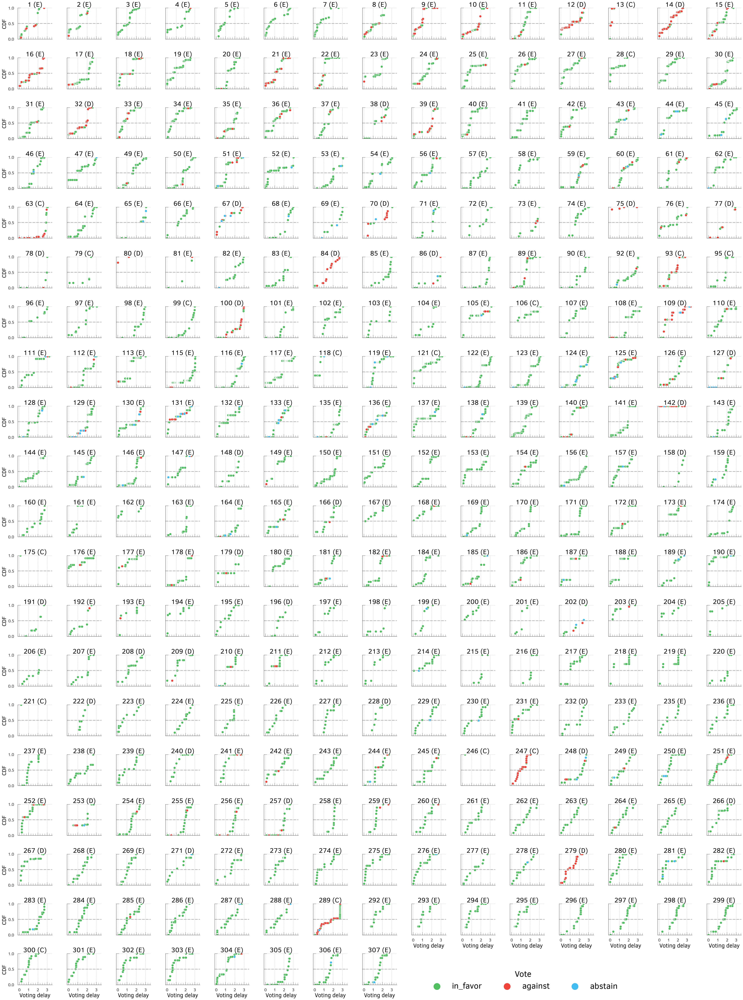

In [46]:
# Convert the timestamp to the minutes/hours it passed since the voting period began
display(voter_ts_df.head())

grid = sns.FacetGrid(voter_ts_df.rename(columns={'Votes fraction': 'CDF'}),
                     col="Proposal", col_wrap=15, hue='Voter', palette=dict(
                         in_favor=colors['green'], against=colors['red'], abstain=colors['blue']))

grid.map(sns.scatterplot, "Voting delay", "CDF", s=100)

grid.set(ylim=(0, 1))

for axes in grid.axes.flatten():
    axes.axhline(y=0.5, color=colors['grey'],
                 linestyle='--', linewidth=3, zorder=1)
    axes.set_xticks([0, 1, 2, 3])
    axes.set_xticks([0.25, 0.5, 0.75, 1.25, 1.5, 1.75,
                    2.25, 2.5, 2.75, 3.25, 3.5], minor=True)
    axes.tick_params(axis='x', which='both')
    proposal_id = int(axes.get_title().split('=')[-1].strip())
    axes.set_title(
        f'{proposal_id} ({proposal_status[proposal_id][0].upper()})')

grid.add_legend(title="Vote")

sns.move_legend(grid, "upper center", ncol=3,
                bbox_to_anchor=(.67, 0.04), fontsize=36, markerscale=3, title='Vote', title_fontsize=36)

file_dir = os.path.join(
    plots_dir, "voting_delay_day_per_proposal_{}.pdf".format(protocol_name))
plt.savefig(file_dir, bbox_inches='tight')

In [47]:
# Average voting delay per day
fig = go.Figure(layout=get_plotly_layout(width=width, height=height))

groupped_data = voter_ts_df.reset_index(drop=True).set_index(
    'Proposal').groupby(level='Proposal')
data = groupped_data['voting_delay'].mean().dt.total_seconds() / 3600 / 24
print("On average, it takes voters {} days to cast their votes.".format(
    data.mean().round(2)))
display(data.describe().to_frame().T)

data = data.to_frame().merge(proposals_created_timestamp_df[[
    'proposalId', 'proposal_created_timestamp']], left_on="Proposal", right_on="proposalId", how="left")
data.columns = ['voting_delay', 'proposalId', 'timestamp']
data = data.set_index('timestamp').sort_index()
data = data['voting_delay'].resample(
    'W').last().ffill().rolling(window=20).mean()

fig.add_trace(go.Scatter(x=data.index, y=data, line=dict(
    color=colors['blue'], width=4), mode='lines'))

fig.update_layout(
    yaxis_title="Voting delay (days)", xaxis_title="Date")

fig.update_xaxes(dtick="M4", tickformat="%b\n%Y",)

file_dir = os.path.join(
    plots_dir, "avg_vote_delay_per_day_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=width, height=height, scale=1)
fig.show(plot_style)

On average, it takes voters 1.4 days to cast their votes.


,count,mean,std,min,25%,50%,75%,max
voting_delay,293.0,1.403862,0.384564,0.125972,1.169472,1.38275,1.633484,2.811135


In [48]:
# Average voting delay per proposal
fig = go.Figure(layout=get_plotly_layout(width=width, height=height))

groupped_data = voter_ts_df.reset_index(drop=True).set_index(
    'Proposal').groupby(level='Proposal')
data = groupped_data['voting_delay'].mean().dt.total_seconds() / 3600 / 24
print("On average, it takes voters {} days to cast their votes.".format(
    data.mean().round(2)))
display(data.describe().to_frame().T)

data = data.to_frame().merge(proposals_created_timestamp_df[[
    'proposalId', 'proposal_created_timestamp']], left_on="Proposal", right_on="proposalId", how="left")
data.columns = ['voting_delay', 'proposalId', 'timestamp']
data = data.set_index('proposalId').sort_index()

fig.add_trace(go.Scatter(x=data.index, y=data['voting_delay'].rolling(window=10).mean(),
                         line=dict(
    color=colors['blue'], width=4), mode='lines'))

fig.update_layout(yaxis_title="Voting delay (days)", xaxis_title="Proposal ID",  xaxis=dict(tickmode='linear', tick0=0, dtick=40),
                  legend=dict(xanchor='center', x=0.5, y=1.15, orientation='h'))

file_dir = os.path.join(
    plots_dir, "avg_vote_delay_per_proposal_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=width, height=height, scale=1)
fig.show(plot_style)

On average, it takes voters 1.4 days to cast their votes.


,count,mean,std,min,25%,50%,75%,max
voting_delay,293.0,1.403862,0.384564,0.125972,1.169472,1.38275,1.633484,2.811135


### Quorum


In [49]:
# Number of voters that voted in favor of the proposal and the number of voters that voted against the proposal and reached the quorum
data = voter_ts_df.query('(Proposal in @proposal_executed_df.proposalId) and (Voter == "in_favor")').groupby(
    'Proposal').apply(lambda x: x.sort_values(by='votes', ascending=False)).reset_index(drop=True)
data['votes_cum'] = data.groupby(
    'Proposal')['votes'].cumsum()

data['ranking'] = data.groupby(
    'Proposal').votes_cum.rank(method='first', ascending=True).astype(int)

data = data.groupby('Proposal').apply(lambda x: x.query(
    'votes_cum >= @proposal_quorum')['ranking'].min())

display(data.describe().to_frame().T)

,count,mean,std,min,25%,50%,75%,max
0,238.0,4.462185,2.518421,2.0,2.0,3.0,7.0,11.0


In [50]:
# It computes how long did it take for the proposal to reach quorum
quorum_df = votes_df.set_index('proposalId').groupby(level='proposalId').apply(lambda x: x.query('support == 1').sort_values(
    by=['blockNumber', 'transactionIndex', 'logIndex'],
    ascending=[True, True, True]).set_index('blockNumber').votes.cumsum().where(lambda x: x >= proposal_quorum).dropna().head(1)
).reset_index().rename(columns={'blockNumber': 'quorum_block_number'})

# It computes the time when the proposal was created
quorum_df = quorum_df.merge(proposal_created_df[['startBlock', 'proposalId']].rename(
    columns={'startBlock': 'blockNumber_start'}), on='proposalId', how='left').dropna()

# It computes the time when the proposal reached quorum
quorum_df = quorum_df.merge(blocks_df, left_on='quorum_block_number', right_on='number',
                            how='left').rename(columns={'timestamp': 'quorum_timestamp'})

quorum_df = quorum_df.merge(
    votes_weighted_df[['proposalId', 'status']], on='proposalId', how='left')

# It computes the time when the proposal was created
quorum_df = quorum_df.merge(blocks_df, left_on='blockNumber_start', right_on='number',
                            how='left').rename(columns={'timestamp': 'proposal_created_timestamp'})
quorum_df.drop(columns=['votes', 'number_x', 'number_y'], inplace=True)
quorum_df['time_to_quorum'] = (quorum_df['quorum_timestamp'] -
                               quorum_df['proposal_created_timestamp']).dt.total_seconds()/3600/24
quorum_df['block_to_quorum'] = quorum_df['quorum_block_number'] - \
    quorum_df['blockNumber_start']
quorum_df.head()

,proposalId,quorum_block_number,blockNumber_start,quorum_timestamp,status,proposal_created_timestamp,time_to_quorum,block_to_quorum
0,1,9964730,9951905,2020-04-29 02:26:04,executed,2020-04-27 02:42:00,1.988935,12825
1,2,9964727,9956585,2020-04-29 02:25:30,executed,2020-04-27 20:09:08,1.261366,8142
2,3,10073762,10065393,2020-05-15 23:54:15,executed,2020-05-14 16:34:47,1.305185,8369
3,4,10132059,10117039,2020-05-25 01:36:44,executed,2020-05-22 17:44:18,2.328079,15020
4,5,10188574,10179119,2020-06-02 20:24:39,executed,2020-06-01 09:13:55,1.465787,9455


In [51]:
maker_colors = {'executed': colors['green'],
                'defeated': colors['red'], 'canceled': colors['blue']}

markers = {'executed': 'circle', 'defeated': 'x', 'canceled': 'diamond-tall'}

data = quorum_df.set_index('proposal_created_timestamp').time_to_quorum

fig = go.Figure(layout=get_plotly_layout(width=1540, height=350))
fig.add_trace(go.Scatter(x=data.index, y=data, line=dict(
    color=colors['grey'], width=2), mode='lines', name='# days', marker_size=5))

data = data.resample('ME').mean()

fig.add_trace(go.Scatter(x=data.index, y=data, line=dict(
    color=colors['blue'], width=4), mode='lines', name='Monthly average', marker_size=10))


for status in ['executed', 'defeated', 'canceled']:
    data = quorum_df.query('(status == @status)').reset_index(drop=True)
    data['text'] = "Proposal #" + data['proposalId'].astype(str)
    fig.add_trace(go.Scatter(x=quorum_df.query('status==@status')['proposal_created_timestamp'],
                             y=[-0.04]*len(quorum_df),
                             mode='markers', name=status.capitalize(),
                             marker=dict(
        color=maker_colors[status], size=15, opacity=0.7, symbol=markers[status], line=dict(width=1, color='white')
    ), text=data['text']))

fig.update_layout(
    xaxis_title='Proposal creation time',
    yaxis_title='Days to reach quorum',
    legend=dict(xanchor='center', x=0.5, y=1.15, orientation='h'),
    yaxis=dict(tickmode='linear', tick0=0, dtick=1)
)
fig.update_xaxes(dtick="M2", tickformat="%b\n%Y",
                 range=[quorum_df.proposal_created_timestamp.min()-pd.Timedelta('3W'),
                        quorum_df.proposal_created_timestamp.max()+pd.Timedelta('3W')])
fig.update_yaxes(range=[-0.2, 3.1])

file_dir = os.path.join(
    plots_dir, "time_to_quorum_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=1540, height=350, scale=1)

fig.show(plot_style)

In [52]:
data = quorum_df.set_index(
    'proposal_created_timestamp').time_to_quorum.describe()
print("On average, it takes {} days for a proposal to reach quorum.".format(
    data['mean'].round(2)))
data.to_frame().T

On average, it takes 1.69 days for a proposal to reach quorum.


,count,mean,std,min,25%,50%,75%,max
time_to_quorum,252.0,1.689402,0.68788,0.086528,1.120903,1.808588,2.146007,3.01735


### Voting Cost


In [53]:
from plot_utils import plot_ohlc

In [54]:
file_dir = os.path.join(data_dir + "transactions_of_votes.csv.gz")
votes_transactions_df = pd.read_csv(file_dir)
votes_transactions_df['timestamp'] = pd.to_datetime(
    votes_transactions_df['timestamp'])
votes_transactions_df.head()

,tx_hash,tx_block_number,tx_effective_gas_price,tx_gas_used,tx_fee_eth,timestamp
0,43cf2f48d2d77816123fb95bc8aa7394cd6d06b7ee219f...,15703859,7546215611,79856,0.000603,2022-10-08 14:05:59
1,c8b44a55e5d9a2593bc110b63362c3d84e5a1fee041575...,17996706,12168780679,79856,0.000972,2023-08-26 05:16:47
2,9dfeb0296e685b3a15fa407715583732045bb9a81e6e3d...,19507380,17965880351,79984,0.001437,2024-03-24 22:32:23
3,dad8a397ed3725c5ae2febd0f9f128c6ab01f17435718a...,10226261,30500000000,63134,0.001926,2020-06-08 16:45:48
4,f69da2f52f4e3b6f2797ac40a9d1edf21d0ef9802cbd4d...,13225977,68000000000,80554,0.005478,2021-09-14 20:23:28


In [55]:
file_fir = os.path.join(data_dir, "yahoo_price_eth_usd.csv")
yahoo_price_df = pd.read_csv(file_fir)
yahoo_price_df.columns = [column.lower() for column in yahoo_price_df.columns]
yahoo_price_df['date'] = pd.to_datetime(yahoo_price_df['date'])
yahoo_price_df.head()

,date,open,high,low,close,adj close,volume
0,2017-11-09,308.644989,329.451996,307.056000,320.884003,320.884003,893249984
1,2017-11-10,320.670990,324.717987,294.541992,299.252991,299.252991,885985984
2,2017-11-11,298.585999,319.453003,298.191986,314.681000,314.681000,842300992
3,2017-11-12,314.690002,319.153015,298.513000,307.907990,307.907990,1613479936
4,2017-11-13,307.024994,328.415009,307.024994,316.716003,316.716003,1041889984


In [56]:
data = yahoo_price_df.set_index('date')['2020-06-01':]

fig = plot_ohlc(data[['open', 'high', 'low', 'close']])
sma = data['close'].rolling(min_periods=1, window=1,
                            center=False).mean().resample('10D').last()
fig.update_layout(
    get_plotly_layout(width=width, height=height),
    showlegend=True,
    legend=dict(xanchor='center', x=0.9, y=.95, orientation='h')
)
fig.add_trace(go.Scatter(x=sma.index, y=sma, mode='lines',
              name='Price', line=dict(color=colors['blue'], width=4)))

fig.update_xaxes(dtick="M4", tickformat="%b\n%Y",)

file_dir = os.path.join(plots_dir, "yahoo_price_eth_usd.pdf")
fig.write_image(file_dir, width=width, height=height)
fig.show(plot_style)

In [57]:
votes_cost_df = votes_df[['blockNumber', 'transactionHash', 'transactionIndex',
                          'logIndex', 'proposalId', 'votes', 'voter']]
votes_cost_df = votes_cost_df.merge(votes_transactions_df[['tx_hash', 'timestamp', 'tx_effective_gas_price', 'tx_gas_used',
                                    'tx_fee_eth']], left_on='transactionHash', right_on='tx_hash', how='left').drop(columns=['tx_hash'])
votes_cost_df['timestamp'] = pd.to_datetime(
    votes_cost_df['timestamp'].dt.strftime('%Y-%m-%d'))
votes_cost_df = votes_cost_df.merge(yahoo_price_df[['date', 'close']].rename(columns={
                                    'close': 'price_usd'}), left_on='timestamp', right_on='date', how='left').drop(columns=['date'])
votes_cost_df['tx_fee_usd'] = votes_cost_df['tx_fee_eth'] * \
    votes_cost_df['price_usd']
votes_cost_df['cost_normalized_per_vote'] = votes_cost_df['tx_fee_usd'] / \
    votes_cost_df['votes']
votes_cost_df.head()

,blockNumber,transactionHash,transactionIndex,logIndex,proposalId,votes,voter,timestamp,tx_effective_gas_price,tx_gas_used,tx_fee_eth,price_usd,tx_fee_usd,cost_normalized_per_vote
0,9952490,07076f7d6247f9c5c4703085b8adf30510bf1f96bdc9ba...,44,35,1,24107.64,0xb0325dbe7fa891436e83a094f9f12848c78e449b,2020-04-27,6750000000,78134,0.000527,197.224716,0.104017,0.000004
1,9952737,70851da3c89a8c1b30833e57bd52225f0752432dcef84d...,99,80,1,1.00,0x181fc4a2b228c0e0f996b736f0310cf9b2e34b56,2020-04-27,9000000000,63134,0.000568,197.224716,0.112064,0.112064
2,9952767,1d0f2246f485d7862a7b5f97ba19059c69733c7642b4dd...,93,126,1,5000.00,0xe3c9ece23316b6b06142fa0ca915f02c323c6b21,2020-04-27,3388000256,63134,0.000214,197.224716,0.042186,0.000008
3,9953038,c8b158cbab11e1ca226bf6ee8a8eeb8337c1771a5f67a3...,112,152,1,12500.00,0x8703028934b24b47496ad84afd635ea7938487be,2020-04-27,5750000000,78112,0.000449,197.224716,0.088582,0.000007
4,9953051,40ad76ab86471ac45a690a2f7cec7be9025940e47699ff...,135,156,1,50000.00,0x1d29756e8f7b091ce6c11a35980de79c7eda5d1f,2020-04-27,8000000000,63134,0.000505,197.224716,0.099613,0.000002


In [58]:
# Voting cost per proposal
fig = go.Figure(layout=get_plotly_layout(width=1540, height=350))

display(votes_cost_df.tx_fee_usd.describe().to_frame().T)
print("All proposals cost a total of ${} in fees.".format(
    votes_cost_df.tx_fee_usd.sum().round(2)))

data = votes_cost_df.groupby('proposalId').tx_fee_usd.sum()
fig.add_trace(go.Scatter(x=data.index, y=data, line=dict(
    color=colors['light_purple'], width=4), mode='lines', name='total cost'))

data = votes_cost_df.groupby('proposalId').tx_fee_usd.median()
fig.add_trace(go.Scatter(x=data.index, y=data, line=dict(
    color=colors['brown'], width=2), mode='lines', name='median cost'))

data = votes_cost_df.query(
    'proposalId not in @proposals_defeated_df.proposalId')
fig.add_trace(go.Box(x=data.proposalId, y=data.tx_fee_usd,
              name='Executed', marker_color=colors['green'], line=dict(width=1.5), whiskerwidth=0.5, fillcolor=colors['white']))

data = votes_cost_df.query(
    'proposalId in @proposals_defeated_df.proposalId')
fig.add_trace(go.Box(x=data.proposalId, y=data.tx_fee_usd,
              name='Defeated', marker_color=colors['red'], line=dict(width=1.5), whiskerwidth=0.5, fillcolor=colors['white']))

data = votes_cost_df.query(
    'proposalId in @proposal_cancelled_df.proposalId')
fig.add_trace(go.Box(x=data.proposalId, y=data.tx_fee_usd,
              name='Canceled', marker_color=colors['blue'], line=dict(width=1.5), whiskerwidth=0.5, fillcolor=colors['white']))

fig.update_layout(yaxis_title="Voting cost (in USD)", xaxis_title="Proposal ID", xaxis=dict(tickmode='linear', tick0=0, dtick=10),
                  legend=dict(xanchor='center', x=0.5, y=1.15, orientation='h'))

fig.update_yaxes(type='log')

file_dir = os.path.join(
    plots_dir, "voting_cost_per_proposal_boxplot_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=1540, height=380, scale=1)
fig.show(plot_style)

,count,mean,std,min,25%,50%,75%,max
tx_fee_usd,14841.0,6.815866,19.042343,0.025054,0.881285,1.665471,4.43664,294.015473


All proposals cost a total of $101154.27 in fees.


In [59]:
# Voting cost per proposal

# maker_colors = {'executed': colors['green'],
#                 'defeated': colors['red'], 'canceled': colors['blue']}

# markers = {'executed': 'circle', 'defeated': 'x', 'canceled': 'diamond-tall'}


# Voting cost per proposal
fig = go.Figure(layout=get_plotly_layout(width=width, height=height))


display(votes_cost_df.tx_fee_usd.describe().to_frame().T)
print("All proposals cost a total of ${} in fees.".format(
    votes_cost_df.tx_fee_usd.sum().round(2)))

data = votes_cost_df.groupby('proposalId').tx_fee_usd.sum()
fig.add_trace(go.Scatter(x=data.index, y=data, line=dict(
    color=colors['light_purple'], width=4), mode='lines', name='total cost'))

data = votes_cost_df.groupby('proposalId').tx_fee_usd.median()
fig.add_trace(go.Scatter(x=data.index, y=data, line=dict(
    color=colors['brown'], width=2), mode='lines', name='median cost'))

# for status in ['executed', 'defeated', 'canceled']:
#     data = proposals_created_timestamp_df.query(
#         'status == @status').reset_index()
#     data['text'] = "Proposal #" + data['proposalId'].astype(str)
#     fig.add_trace(go.Scatter(x=proposals_created_timestamp_df.query('status==@status')['proposalId'],
#                              y=[0.1]*len(proposals_created_timestamp_df),
#                              mode='markers', name=status.capitalize(),
#                              marker=dict(
#         color=maker_colors[status], size=15, opacity=0.7, symbol=markers[status], line=dict(width=1, color='white')
#     ), text=data['text']))

fig.update_layout(yaxis_title="Voting cost (in USD)", xaxis_title="Proposal ID", xaxis=dict(tickmode='linear', tick0=0, dtick=20, range=[0, proposal_created_df.proposalId.max()]),
                  yaxis=dict(tickmode='linear', tick0=0, dtick=1),
                  legend=dict(xanchor='center', x=0.5, y=1.15, orientation='h'))

fig.update_yaxes(type='log')

file_dir = os.path.join(
    plots_dir, "voting_cost_per_proposal_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=width, height=height, scale=1)
fig.show(plot_style)

,count,mean,std,min,25%,50%,75%,max
tx_fee_usd,14841.0,6.815866,19.042343,0.025054,0.881285,1.665471,4.43664,294.015473


All proposals cost a total of $101154.27 in fees.


In [60]:
# Distribution of the voting cost per proposal
votes_cost_df.groupby('proposalId').tx_fee_usd.sum().describe().to_frame().T

,count,mean,std,min,25%,50%,75%,max
tx_fee_usd,293.0,345.2364,543.231257,1.222473,75.985752,167.521971,330.936633,4247.25447


In [61]:
# Normalized voting cost per proposal

min_votes = 1e-6

fig = go.Figure(layout=get_plotly_layout(width=1540, height=350))

data = votes_cost_df.query(
    '(proposalId not in @proposals_defeated_df.proposalId) and (votes >= @min_votes)')
fig.add_trace(go.Box(x=data.proposalId, y=data.cost_normalized_per_vote,
              name='Executed', marker_color=colors['green'], line=dict(width=1.5), whiskerwidth=0.5, fillcolor=colors['white']))

data = votes_cost_df.query(
    '(proposalId in @proposals_defeated_df.proposalId) and (votes >= @min_votes)')
fig.add_trace(go.Box(x=data.proposalId, y=data.cost_normalized_per_vote,
              name='Defeated', marker_color=colors['red'], line=dict(width=1.5), whiskerwidth=0.5, fillcolor=colors['white']))

data = votes_cost_df.query(
    '(proposalId in @proposal_cancelled_df.proposalId) and (votes >= @min_votes)')
fig.add_trace(go.Box(x=data.proposalId, y=data.cost_normalized_per_vote,
              name='Canceled', marker_color=colors['blue'], line=dict(width=1.5), whiskerwidth=0.5, fillcolor=colors['white']))

fig.update_layout(yaxis_title="Cost per vote unit (USD)", xaxis_title="Proposal ID", xaxis=dict(tickmode='linear', tick0=0, dtick=10),
                  legend=dict(xanchor='center', x=0.5, y=1.15, orientation='h'))

fig.update_yaxes(type='log')

file_dir = os.path.join(
    plots_dir, "voting_cost_per_proposal_normalized_{}.pdf".format(protocol_name))

fig.write_image(file_dir, width=1540, height=380, scale=1)
fig.show(plot_style)

In [62]:
# Distribution of the normalized voting cost per proposal
data['cost_normalized_per_vote'].describe().to_frame().T

,count,mean,std,min,25%,50%,75%,max
cost_normalized_per_vote,584.0,598.97225,7739.339094,0.000004,0.002067,6.382188,43.723012,138170.575268


### Vote Similarity


In [63]:
# Cosine similarity
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans

In [64]:
from plot_utils import plot_heatmap_votes, plot_heatmap

In [65]:
voter_df = votes_df[['proposalId', 'voter', 'support']].reset_index(drop=True)
voter_df['voter_label'] = voter_df['voter'].apply(
    lambda x: labels.get(x, x[:6]+"..."+x[-4:]))
voter_df.head()

,proposalId,voter,support,voter_label
0,1,0xb0325dbe7fa891436e83a094f9f12848c78e449b,1,Calvin Liu
1,1,0x181fc4a2b228c0e0f996b736f0310cf9b2e34b56,1,0x181f...4b56
2,1,0xe3c9ece23316b6b06142fa0ca915f02c323c6b21,1,dakeshi
3,1,0x8703028934b24b47496ad84afd635ea7938487be,0,Jacob
4,1,0x1d29756e8f7b091ce6c11a35980de79c7eda5d1f,1,InstaDApp


In [66]:
# Voters who votred on more proposals
voter_df['voter_label'].value_counts().head()

voter_label
Michigan Blockchain    192
Franklin DAO           184
MonetSupply            167
allthecolors           163
Gauntlet               154
Name: count, dtype: int64

In [67]:
n_votes = 10
top_voters = voter_df['voter_label'].value_counts()
top_voters = top_voters[top_voters >= n_votes].index
print("There are {} ({}%) out of {} voters with at least {} votes".format(len(top_voters),
      round(100*len(top_voters)/voter_df['voter_label'].nunique(), 2), voter_df.voter.nunique(), n_votes))

There are 178 (3.93%) out of 4538 voters with at least 10 votes


In [68]:
votes_vector = voter_df.query('voter_label in @top_voters')[['proposalId', 'support', 'voter_label']].pivot_table(
    index='voter_label', columns='proposalId', values='support').loc[top_voters]

missing_proposals = set(votes_weighted_df.proposalId) - \
    set(votes_vector.columns)
print("There are {} missing proposals".format(len(missing_proposals)))
print(sorted(missing_proposals))
for proposalId in missing_proposals:
    votes_vector[proposalId] = np.nan
votes_vector = votes_vector[votes_weighted_df.proposalId]

There are 15 missing proposals
[48, 55, 88, 91, 94, 114, 120, 134, 155, 175, 183, 234, 270, 290, 291]


In [69]:
# Plot how each of the top 10 voters (based on # of proposals voted) voted on each proposal
fig = plot_heatmap_votes(
    df=votes_vector.head(15), xgap=1, ygap=1)

fig.update_layout(yaxis=dict(tickfont=dict(size=12.9)))

file_dir = os.path.join(
    plots_dir, "heatmap_votes_top_voters_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=width, height=height, scale=1)
fig.show(plot_style)

In [70]:
proposal_ids = sorted(set(votes_vector.columns) - set(missing_proposals))
data = votes_vector[proposal_ids]+1
cosine_df = pd.DataFrame(cosine_similarity(
    data.fillna(0)), index=data.index, columns=data.index)
cosine_df.head()

voter_label,Michigan Blockchain,Franklin DAO,MonetSupply,allthecolors,Gauntlet,Wintermute,dakeshi,Avantgarde,PGov,0x84e3...5a95,...,0x4027...7164,0x9a84...5601,psykotisk.eth,cn186.eth,0x8d52...6f34,EXuniT007,0xe1a2...1780,0x83d2...ee80,0x0761...8b4f,0xbf4c...5a7c
voter_label,,,,,,,,,,,,,,,,,,,,,
Michigan Blockchain,1.000000,0.797800,0.575877,0.751320,0.535362,0.794114,0.483675,0.775304,0.750929,0.401957,...,0.184506,0.184506,0.207570,0.138380,0.225075,0.119900,0.225075,0.181363,0.230633,0.143880
Franklin DAO,0.797800,1.000000,0.574429,0.705317,0.573307,0.713379,0.461425,0.691048,0.681383,0.427493,...,0.189220,0.212872,0.165567,0.212872,0.080789,0.172149,0.161577,0.224479,0.165567,0.202890
MonetSupply,0.575877,0.574429,1.000000,0.558775,0.576726,0.380390,0.602404,0.449201,0.353475,0.659320,...,0.248452,0.248452,0.149071,0.099381,0.157602,0.206662,0.242464,0.141479,0.049690,0.187288
allthecolors,0.751320,0.705317,0.558775,1.000000,0.504555,0.666877,0.450450,0.642556,0.619021,0.416966,...,0.175412,0.225529,0.200470,0.137823,0.158957,0.221467,0.207867,0.129105,0.175412,0.182384
Gauntlet,0.535362,0.573307,0.576726,0.504555,1.000000,0.436525,0.493235,0.446109,0.433906,0.504058,...,0.076948,0.179546,0.025649,0.102598,0.112641,0.133345,0.225282,0.062597,0.102598,0.146680


In [71]:
fig = plot_heatmap(
    cosine_df.head(15),
    freq_text="Cosine similarity",  font_size_z=12, annotation=True)

fig.update_layout(yaxis=dict(tickfont=dict(size=12)))
fig.update_traces(showscale=False)

file_dir = os.path.join(
    plots_dir, "cosine_similarity_top_voters_{}.pdf".format(protocol_name))
fig.write_image(file_dir, width=1540, height=380, scale=1)
fig.show(plot_style)

In [72]:
data_votes = voter_df.query('voter_label in @top_voters')[['proposalId', 'support', 'voter_label']].pivot_table(
    index='voter_label', columns='proposalId', values='support').loc[top_voters]
data_votes = data_votes.clip(0, 1).fillna(0)
data_votes.head()

proposalId,1,2,3,4,5,6,7,8,9,10,...,298,299,300,301,302,303,304,305,306,307
voter_label,,,,,,,,,,,,,,,,,,,,,
Michigan Blockchain,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Franklin DAO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0
MonetSupply,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0
allthecolors,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Gauntlet,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0


In [73]:
cosine_df = pd.DataFrame(cosine_similarity(
    data_votes), index=data_votes.index, columns=data_votes.index)
cosine_df.head()

voter_label,Michigan Blockchain,Franklin DAO,MonetSupply,allthecolors,Gauntlet,Wintermute,dakeshi,Avantgarde,PGov,0x84e3...5a95,...,0x4027...7164,0x9a84...5601,psykotisk.eth,cn186.eth,0x8d52...6f34,EXuniT007,0xe1a2...1780,0x83d2...ee80,0x0761...8b4f,0xbf4c...5a7c
voter_label,,,,,,,,,,,,,,,,,,,,,
Michigan Blockchain,1.000000,0.795774,0.569162,0.754870,0.537865,0.796483,0.460317,0.773791,0.752676,0.389271,...,0.185996,0.185996,0.209246,0.139497,0.220564,0.122536,0.220564,0.181956,0.232495,0.147043
Franklin DAO,0.795774,1.000000,0.575884,0.698820,0.568421,0.714064,0.450436,0.692199,0.681748,0.425417,...,0.190153,0.213922,0.166384,0.213922,0.075165,0.175384,0.150329,0.212598,0.166384,0.200439
MonetSupply,0.569162,0.575884,1.000000,0.567789,0.577301,0.385742,0.585341,0.454980,0.358352,0.648410,...,0.252377,0.252377,0.151426,0.100951,0.159617,0.212823,0.239426,0.141083,0.050475,0.186220
allthecolors,0.754870,0.698820,0.567789,1.000000,0.505053,0.673710,0.441092,0.645244,0.624370,0.405907,...,0.178958,0.230089,0.204524,0.127827,0.161690,0.215587,0.188639,0.114332,0.178958,0.188639
Gauntlet,0.537865,0.568421,0.577301,0.505053,1.000000,0.438397,0.477890,0.446981,0.435522,0.502751,...,0.077981,0.181956,0.025994,0.103975,0.109599,0.136999,0.219199,0.058124,0.103975,0.136999


In [74]:
colorscale = [
    [0, colors['white']],
    [0.1, colors['white']],
    [0.1, colors['white']],
    [0.2, colors['white']],
    [0.2, colors['white']],
    [0.3, colors['white']],

    [0.3,  colors['white']],
    [0.4,  colors['white']],

    [0.4,  colors['white']],
    [0.5,  colors['white']],

    [0.5,  colors['blue']],
    [0.6,  colors['blue']],

    [0.6, colors['blue']],
    [0.7, colors['blue']],

    [0.7, colors['blue']],
    [0.8, colors['blue']],

    [0.8, colors['blue']],
    [0.9, colors['blue']],

    [0.9, colors['blue']],
    [1.0, colors['blue']]
]

fig = plot_heatmap_votes(df=data_votes.head(15), ticktext=['Non-vote', 'Voted'],
                         zmax=0, tickvals=[0, 1], colorscale=colorscale,  colorbarlen=100)

fig.update_layout(yaxis=dict(tickfont=dict(size=12)))

In [75]:
data_votes

proposalId,1,2,3,4,5,6,7,8,9,10,...,298,299,300,301,302,303,304,305,306,307
voter_label,,,,,,,,,,,,,,,,,,,,,
Michigan Blockchain,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Franklin DAO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0
MonetSupply,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0
allthecolors,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Gauntlet,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EXuniT007,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0xe1a2...1780,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0x83d2...ee80,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [76]:
proposal_ids = sorted(set(votes_vector.columns) - set(missing_proposals))
data = votes_vector[proposal_ids]+1
cosine_df = pd.DataFrame(cosine_similarity(
    data.fillna(0)), index=data.index, columns=data.index)
cosine_df.head()

voter_label,Michigan Blockchain,Franklin DAO,MonetSupply,allthecolors,Gauntlet,Wintermute,dakeshi,Avantgarde,PGov,0x84e3...5a95,...,0x4027...7164,0x9a84...5601,psykotisk.eth,cn186.eth,0x8d52...6f34,EXuniT007,0xe1a2...1780,0x83d2...ee80,0x0761...8b4f,0xbf4c...5a7c
voter_label,,,,,,,,,,,,,,,,,,,,,
Michigan Blockchain,1.000000,0.797800,0.575877,0.751320,0.535362,0.794114,0.483675,0.775304,0.750929,0.401957,...,0.184506,0.184506,0.207570,0.138380,0.225075,0.119900,0.225075,0.181363,0.230633,0.143880
Franklin DAO,0.797800,1.000000,0.574429,0.705317,0.573307,0.713379,0.461425,0.691048,0.681383,0.427493,...,0.189220,0.212872,0.165567,0.212872,0.080789,0.172149,0.161577,0.224479,0.165567,0.202890
MonetSupply,0.575877,0.574429,1.000000,0.558775,0.576726,0.380390,0.602404,0.449201,0.353475,0.659320,...,0.248452,0.248452,0.149071,0.099381,0.157602,0.206662,0.242464,0.141479,0.049690,0.187288
allthecolors,0.751320,0.705317,0.558775,1.000000,0.504555,0.666877,0.450450,0.642556,0.619021,0.416966,...,0.175412,0.225529,0.200470,0.137823,0.158957,0.221467,0.207867,0.129105,0.175412,0.182384
Gauntlet,0.535362,0.573307,0.576726,0.504555,1.000000,0.436525,0.493235,0.446109,0.433906,0.504058,...,0.076948,0.179546,0.025649,0.102598,0.112641,0.133345,0.225282,0.062597,0.102598,0.146680
